In [1]:
"""PARAMETERS TO CAPTURE ON STDIN VIA PAPERMILL...."""
#config_path = 'configs/species_experiments/Escherichia_coli_lysate.yaml'
#config_path = 'configs/global_loss_composed_globalAvgtm/global_allmeltome.yaml'
#config_path = 'configs/global_loss_composed_globalAvgtm/global_allmeltome_cleaned.yaml'
#config_path = 'configs/species_experiments_loss_composed_globalAvgtm_cleanup/loss2/Arabidopsis_thaliana_seedling_lysate.yaml'
#config_path = "configs/species_experiments_loss_composed_globalAvgtm/loss2/Geobacillus_stearothermophilus_NCA26_lysate.yaml"
config_path = "configs/species_experiments_loss_composed_globalAvgtm/loss2/Arabidopsis_thaliana_seedling_lysate.yaml"


In [2]:
# Parameters
config_path = "configs/global_loss_composed_globalAvgtm/global_allmeltome_speedup.yaml"


In [3]:
import yaml

print(f"the value of path captured is: {config_path}")

with open(config_path, 'r') as file:
    config = yaml.safe_load(file)
    
#print(config)
#print(f"the value of path captured is: {config_path}")

the value of path captured is: configs/global_loss_composed_globalAvgtm/global_allmeltome_speedup.yaml


In [4]:
#import ipdb; ipdb.set_trace()

path_progresESM    = config['initial_paths']['path_progresESM']
checkpoint_pathESM = config['initial_paths']['checkpoint_pathESM']

path_progresPiFold    = config['initial_paths']['path_progresPiFold']
checkpoint_pathPiFold = config['initial_paths']['checkpoint_pathPiFold']


path_progresMix= config['initial_paths']['path_progresMix']
#checkpoint_pathMix='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023_finetunning_NoMLPincNoBN_lrx00001_lossmod/'
checkpoint_pathMix= config['initial_paths']['checkpoint_pathMix']


organism = config['organism']['organism']
keyword = config['organism']['keyword']

#ESM_source = 'esm2_embeddings'
ESM_source = config['initial_paths']['ESM_source']
PiFold_source = config['initial_paths']['PiFold_source']

prepro_train_emb_ESM = config['initial_paths']['prepro_train_emb_ESM']
prepro_test_emb_ESM  = config['initial_paths']['prepro_test_emb_ESM']
prepro_val_emb_ESM   = config['initial_paths']['prepro_val_emb_ESM']

prepro_train_emb_PiFold = config['initial_paths']['prepro_train_emb_PiFold']
prepro_test_emb_PiFold  = config['initial_paths']['prepro_test_emb_PiFold']
prepro_val_emb_PiFold   = config['initial_paths']['prepro_val_emb_PiFold']

In [5]:
import __init__

from src.utilities import train_test_validation_splits, \
                            prepare_train_test_val_seqs_by_batches, \
                            tensor2dataloader, load_full_meltome_FLIP_db, \
                            seek_UniprotID_association_Meltome_prots,\
                            download_UniprotID_Alphafold_Structures,\
                            get_guided_encoder_output,\
                            ESM2_IF_repr
                            
import pandas as pd
import numpy as np
    
import ipdb
path_meltome = config['meltome']['path_meltome']
complete_meltome_db = config['meltome']['complete_meltome_db']

full_meltome_db = load_full_meltome_FLIP_db(complete_meltome_db)

splits_meltome = pd.read_csv(path_meltome, sep=',')

#import ipdb; ipdb.set_trace()

splits_meltome = seek_UniprotID_association_Meltome_prots(splits_meltome, full_meltome_db)
split_meltome = splits_meltome[splits_meltome['sequence'].str.len()>= 50]
#import ipdb; ipdb.set_trace()
'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

list_bacteria = [ "Caenorhabditis_elegans_lysate", "Saccharomyces_cerevisiae_lysate", "Escherichia_coli_lysate", 
                 "Escherichia_coli_cells", "Bacillus_subtilis_168_lysate_R1", "Oleispira_antarctica_RB-8_lysate_R1", 
                 "Picrophilus_torridus_DSM9790_lysate", "Thermus_thermophilus_HB27_cells", 
                 "Geobacillus_stearothermophilus_NCA26_lysate", "Thermus_thermophilus_HB27_lysate"]
#splits_meltome = splits_meltome[ splits_meltome.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

train, val, test = train_test_validation_splits(splits_meltome)

print("Done")



Done


In [6]:
import torch
import src.IF_PiFold_embeddings  as PiFoldconf 
#from src.IF_PiFold_embeddings import PiFold_setup


args = PiFoldconf.get_parser()
exp = PiFoldconf.PiFold_setup(args)
svpath = config['Pifold_pretrain']['svpath']
exp.method.load_state_dict(torch.load(svpath+'checkpoint.pth'))


Use GPU: cuda:0



device: 	cuda	
display_step: 	10	
res_dir: 	results	
ex_name: 	ProDesign	
use_gpu: 	True	
gpu: 	0	
seed: 	111	
data_name: 	CATH	
data_root: 	data/	
batch_size: 	8	
num_workers: 	8	
method: 	ProDesign	
config_file: 	None	
hidden_dim: 	128	
node_features: 	128	
edge_features: 	128	
k_neighbors: 	30	
dropout: 	0.1	
num_encoder_layers: 	10	
epoch: 	100	
log_step: 	1	
lr: 	0.001	
patience: 	100	
updating_edges: 	4	
node_dist: 	1	
node_angle: 	1	
node_direct: 	1	
edge_dist: 	1	
edge_angle: 	1	
edge_direct: 	1	
virtual_num: 	3	


<All keys matched successfully>

In [7]:
from tqdm.auto import tqdm
import torch
from src.ESM2embeddings import ESM2embeddings
from src.ESM2_IF1_embeddings import ESM2_IF1_embeddings
from src.utilities import train_test_validation_splits, prepare_train_test_val_seqs_by_batches, tensor2dataloader,read_and_plot_loss_curves, cleanup_by_organism_and_correspondence_idx
from src.NeuralArchitectures import regressionHead

from src.AdaptiveDataset import AdaptiveDataset

structuredir =  config['structures_path']['structuredir']
meltome_struct_dir_labels =  config['structures_path']['meltome_struct_dir_labels']

#import ipdb; ipdb.set_trace()
import os 
if not os.listdir(structuredir) and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt'): 
    
    print("Finding structures to proteins via Alphafold/PDB dbs..........") 
    
    download_UniprotID_Alphafold_Structures(train, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_train')
    download_UniprotID_Alphafold_Structures(test, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_test')
    download_UniprotID_Alphafold_Structures(val, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_val')


#import ipdb; ipdb.set_trace()
Structinfo_Meltome_Splits_train = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt', sep='\t').set_index(train.index)
Structinfo_Meltome_Splits_test = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt', sep='\t').set_index(test.index)
Structinfo_Meltome_Splits_val = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt', sep='\t').set_index(val.index)


#import ipdb; ipdb.set_trace()

train = pd.concat([train, Structinfo_Meltome_Splits_train], axis=1).query('Source=="alphafold"')
test = pd.concat([test, Structinfo_Meltome_Splits_test], axis=1).query('Source=="alphafold"')
val = pd.concat([val, Structinfo_Meltome_Splits_val], axis=1).query('Source=="alphafold"')

"""
import ipdb; ipdb.set_trace()
if config['organism']['Global']==True:
    idxdf_idxfile_train, _ = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, _ = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, _ = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        clusters=pd.read_csv(config['meltome']['umap_clusters_clean_meltome_train'], sep='\t').cluster.tolist()
        train['umap_clusters'] = clusters
        train =  train[train.umap_clusters !=-1]
    
else:
    idxdf_idxfile_train, train = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, test = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, val = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
"""

#import ipdb; ipdb.set_trace()
if 'umap_clusters_clean_meltome_train' in config['meltome']:
    clusters=pd.read_csv(config['meltome']['umap_clusters_clean_meltome_train'], sep='\t').cluster.tolist()
    # cluster keys columns are related to the dictionary from cleanup_by_organism_and_correspondence_idx method
    # so if you need a mapping of the sample, you need to use that index to get the proper sampled idx from original
    # pandas dataframe. Recap : idx_numbering -> pandas_idx_original_cleaned_data
    train['umap_clusters'] = clusters

if config['organism']['Global']==True:
    idxdf_idxfile_train, _ = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, _ = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, _ = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        train =  train[train.umap_clusters !=-1]
    
    ''' In case we want a universal average tm independent from organism - Unlikely'''    
    #train['OGTest_organism']=[train.tm_organism.mean()]*len(train)
    #val['OGTest_organism']=[val.tm_organism.mean()]*len(val)
    train['OGTest_organism'] = train.organism.map( train.groupby('organism').apply(lambda a: a.target.astype(float).mean()) )
    val['OGTest_organism'] = val.organism.map( val.groupby('organism').apply(lambda a: a.target.astype(float).mean()) )
 
else:
    idxdf_idxfile_train, train = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, test = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, val = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        train =  train[train.umap_clusters !=-1]
    
    #train['OGTest_organism']=[train.tm_organism.mean()]*len(train)
    #val['OGTest_organism']=[val.tm_organism.mean()]*len(val)
    
    train['OGTest_organism']=[train.target.astype(float).mean()]*len(train)
    val['OGTest_organism']=[val.target.astype(float).mean()]*len(val)


'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

#train = train[ train.organism.isin( list_bacteria ) ]
#test = test[ test.organism.isin( list_bacteria ) ]
#val = val[ val.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

'------------------------------------------------------------------------------------------------------------------------------'

In [8]:
train.shape
print(train)
print(train.columns)
#train.to_csv('../datasets/train_MeltomeMix_for_cleaning.csv', sep="\t", index=False)
#import ipdb; ipdb.set_trace()
"""
# temp fasta file convertion to cleaning
with open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:
    for k, v in zip(train.index.tolist(),train.sequence):
        f.write(f'>{k}\n{v}\n')
"""

                                                sequence            target  \
0      MSGEEEKAADFYVRYYVGHKGKFGHEFLEFEFRPNGSLRYANNSNY...  37.9629473421417   
1      MSMGSDFYLRYYVGHKGKFGHEFLEFEFRPDGKLRYANNSNYKNDV...  54.4253424806097   
2      MRICFLLLAFLVAETFANELTRCCAGGTRHFKNSNTCSSIKSEGTS...  49.4592155176475   
3      MIRVALPTTASAIPRSISTSPGETISKNHEEEVKRVWRKADAVCFD...  42.5931308043435   
4      MNGDWSRAFVLSKVKNLYFFVIIDKGFSAILNDPREPVQVGGFFEV...  37.9994780790578   
...                                                  ...               ...   
27944  MAVVLPAVVEELLSEMAAAVQESARIPDEYLLSLKFLFGSSATQAL...  56.8600005753223   
27945  MLSCNICGETVTSEPDMKAHLIVHMESEIICPFCKLSGVNYDEMCF...  45.1243026020368   
27946  MDLPALLPAPTARGGQHGGGPGPLRRAPAPLGASPARRRLLLVRGP...   47.008000426981   
27947  MPEDQAGAAMEEASPYSLLDICLNFLTTHLEKFCSARQDGTLCLQE...  51.8978809719254   
27948  MAAPRPSPAISVSVSAPAFYAPQKKFGPVVAPKPKVNPFRPGDSEP...  63.5734388197048   

         set  validation  protein_id  \
0      train       Fals

"\n# temp fasta file convertion to cleaning\nwith open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:\n    for k, v in zip(train.index.tolist(),train.sequence):\n        f.write(f'>{k}\n{v}\n')\n"

In [9]:

import torch, os, gc
import torch_geometric
import torch_sparse
from torch_geometric.nn import MessagePassing
import warnings
warnings.filterwarnings('ignore')



pt_batch_size = 16
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ESM2 = ESM2embeddings(type_embedding = "facebook/esm2_t33_650M_UR50D", device = device, type_tool='FacebookESM2')

dir_pre_generated_embeddings =  config['ESM2embeddings']['dir_pre_generated_embeddings'] 
dir_IFPiFold_Meltome_train = dir_pre_generated_embeddings + PiFold_source + '/Meltome_train/'
dir_IFPiFold_Meltome_test = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_test/'
dir_IFPiFold_Meltome_val = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_val/'


path_train= dir_pre_generated_embeddings+prepro_train_emb_ESM
path_test= dir_pre_generated_embeddings+prepro_test_emb_ESM
path_val= dir_pre_generated_embeddings+prepro_val_emb_ESM

"""
path_esm2_train= dir_pre_generated_embeddings+'esm2_embeddings/train/'
path_esm2_test= dir_pre_generated_embeddings+'esm2_embeddings/test/'
path_esm2_val= dir_pre_generated_embeddings+'esm2_embeddings/val/'
"""

path_esm2_train= dir_pre_generated_embeddings+ESM_source+'/Meltome/train/'
path_esm2_test= dir_pre_generated_embeddings+ESM_source+'/Meltome/test/'
path_esm2_val= dir_pre_generated_embeddings+ESM_source+'/Meltome/val/'




def padding_tensor( a, size_end ,val_pad=0):
    a_size = a.shape
    f_size = torch.zeros(size_end[0], size_end[1])
    
    if size_end[0]>=a_size[0]:
        f_size[0:a_size[0]] = a
    else:
        f_size = a[0:size_end[0]]
    return f_size

def ensemble_dataset_from_IF_embeddings(folder_path, max_size=600, dim_IF=128):
    import os
    
    paths = os.listdir(folder_path)
    list_max=[]
    tensor_container = torch.zeros(len(paths),max_size,dim_IF)
    print('Starting load of Inverse Folding Embeddings:  \n')
    
    for i in tqdm(range(0,len(paths))):
        tmp_tensor = torch.load(folder_path+paths[i])
        list_max.append(tmp_tensor.shape[0])
        tmp_tensor = padding_tensor(tmp_tensor, [max_size,dim_IF])
        tensor_container[i]=tmp_tensor
        
    print('maximum structure length in meltome: ' + str(max(list_max)))
    return tensor_container
              

def embedding_builder_ESM2(ESM2, device, train, test, val, path_train, path_test, path_val):
    if os.path.isfile(path_train)==False and os.path.isfile(path_test)==False and os.path.isfile(path_val)==False:
        print ("Creating Embeddings...")   
        train_embeddings = ESM2.esm2embedding(train, device, layer_index=33,folder_path=path_esm2_train) #esm2embedding(train, model, batch_converter, device, layer_index=33)#BERT.embed_dataset(batch_train)
        torch.save(train_embeddings, path_train)
        test_embeddings = ESM2.esm2embedding(test, device, layer_index=33,folder_path=path_esm2_test) #esm2embedding(test, model, batch_converter, device, layer_index=33)
        torch.save(test_embeddings, path_test)
        val_embeddings = ESM2.esm2embedding(val, device, layer_index=33,folder_path=path_esm2_val) #esm2embedding(val, model, batch_converter, device, layer_index=33)
        torch.save(val_embeddings, path_val)
        print ("Loaded")
    else:
        print ("Loading Premade Embeddings...")
        train_embeddings = torch.load(path_train)
        test_embeddings = torch.load(path_test)
        val_embeddings = torch.load(path_val)
        print ("Loaded")
    return train_embeddings, test_embeddings, val_embeddings

#def IFBuilder_sets(model, alphabet, train, test, val, path_IFtrain, path_IFtest, path_IFval):
def IFBuilder_sets(IF, train, test, val, path_IFtrain, path_IFtest, path_IFval):

    if len(os.listdir(path_IFtrain))==0 and len(os.listdir(path_IFtest))==0 and len(os.listdir(path_IFval))==0: #os.path.isfile(path_IFtrain)==False and os.path.isfile(path_IFtest)==False and os.path.isfile(path_IFval)==False:

        #IF_embeddings_train = ESM2_IF_repr(train, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_train')
        IF_embeddings_train = IF.IF_repr(train, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_train')
        torch.save(IF_embeddings_train, path_IFtrain)

        #IF_embeddings_test = ESM2_IF_repr(test, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_test')
        IF_embeddings_test = IF.IF_repr(test, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_test')
        torch.save(IF_embeddings_test, path_IFtest)

        #IF_embeddings_val = ESM2_IF_repr(val, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_val')
        IF_embeddings_val = IF.IF_repr(val, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_val')
        torch.save(IF_embeddings_val, path_IFval)
    else:
        print ("Loading Premade Embeddings...")
        # 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
        #ipdb.set_trace()
        IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
        IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
        IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
        print ("Loaded")
    return IF_embeddings_train, IF_embeddings_test, IF_embeddings_val

# 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
'''
IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
'''


'\nIF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)\nIF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)\nIF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)\n'

In [10]:
#_, _, _ = embedding_builder_ESM2(ESM2, device, train, test, val,  path_train, path_test, path_val)

train_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                   emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_train ) , batch_size=150, shuffle=True)
test_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

train_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)


train_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

In [11]:
from src.NeuralArchitectures import *

import ipdb

import os
from os import listdir
from os.path import isfile, join

def generating_results_approaches(FFNNreg, Trner, train_loader, val_loader, test_loader,loss, opt, epochs, device,
                                  path_progres='train_progress_k1_b10.txt', 
                                  checkpoint_path='../checkpoints/k1_b10/',
                                  output_metrics='metrics_per_species/Ecoli_Lysate.txt'):
    if os.path.exists(checkpoint_path):
        if os.path.exists(checkpoint_path+path_progres):
            tmp=checkpoint_path+path_progres
            onlyfiles = os.listdir(checkpoint_path) #[f for f in listdir(tmp) if isfile(join(tmp, f))]
            bestepoch = onlyfiles[-1]
            #parse_progress = "\n".join(s for s in onlyfiles if 'train' in s)
            read_and_plot_loss_curves(checkpoint_path+path_progres)
            
            FFNNreg, _, _, _ = \
                    Trner.load_checkpoint(
                        checkpoint_path+bestepoch, FFNNreg, opt
                        )
            FFNNreg=FFNNreg.to(device)
            
    else:
        FFNNreg, val_loss = Trner.train_LLMRegresor(train_loader, val_loader, FFNNreg, device, loss, opt, epochs,
                                                path_progres, checkpoint_path)

    #test_set, test_labels = next(test_loader)#.dataset.tensors
    test_labels, outcome = Trner.test_model(FFNNreg, test_loader, loss, device)

    from src.utilities import plot_results
    #ipdb.set_trace()
    
    if not os.path.exists( '/'.join(output_metrics.split('/')[:-1]) ):
        os.makedirs( '/'.join(output_metrics.split('/')[:-1]) )
        
    with open( output_metrics, "w") as file1:
        from torchmetrics import SpearmanCorrCoef
        loss_test = torch.nn.MSELoss()(outcome, test_labels)
        mae = torch.nn.L1Loss()(outcome, test_labels)
        
        spearman = SpearmanCorrCoef()
        spear_corr = spearman(outcome.flatten(), test_labels.flatten())
        file1.write('MSE: ' + str(loss_test) +"\n")
        file1.write('RMSE: ' + str(torch.sqrt(loss_test)) +"\n")
        file1.write('MAE: ' + str(mae) +"\n")
        file1.write('Spearman Corr: ' + str(spear_corr))
    

    plot_results( outcome, test_labels)





In [12]:
from src.Trainer_seq_struct2 import Trainer_Seq_Struct2

Trainer3 = Trainer_Seq_Struct2(avgtm_mode='global')

from src.NeuralArchitectures import *


class BiasOrganismLoss(torch.nn.Module):
    
    def __init__(self, device):
        super(BiasOrganismLoss, self).__init__()
        self.device = device
        self.MSE = torch.nn.MSELoss()        
             
    def forward(self, predOGTTM: torch.tensor , target: torch.tensor, avg_TmOrganism: torch.tensor):
        #import ipdb; ipdb.set_trace()
        #return self.MSE( (predOGTTM[:,0] ).unsqueeze(-1), target.to(self.device))
        return self.MSE( (predOGTTM[:,0] + predOGTTM[:,1]).unsqueeze(-1), target.to(self.device))  + self.MSE( predOGTTM[:,0].unsqueeze(-1) , avg_TmOrganism) 


### For RAW ESM2 Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/ESM2_only/Global/AllMeltome_composed_loss_globalAvgtm_speed/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 1453.395 val loss: 84.267


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 82.673 val loss: 66.328


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 62.772 val loss: 209.503


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 54.722 val loss: 172.791


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 46.641 val loss: 212.085


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 42.497 val loss: 59.556


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 39.762 val loss: 51.566


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 36.767 val loss: 1458.877


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 34.134 val loss: 55.626


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 32.454 val loss: 90.876


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 31.127 val loss: 52.784


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 29.415 val loss: 51.880


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 30.416 val loss: 55.315


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 29.349 val loss: 55.568


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 28.732 val loss: 50.976


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 27.908 val loss: 54.192


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 26.842 val loss: 48.227


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 25.650 val loss: 49.645


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 24.520 val loss: 49.554


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 24.550 val loss: 53.835


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 23.733 val loss: 48.449


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 24.635 val loss: 50.276


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 23.952 val loss: 55.194


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 24.027 val loss: 47.705


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 22.890 val loss: 50.761


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 21.818 val loss: 49.223


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 22.544 val loss: 48.437


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 22.003 val loss: 47.759


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 21.066 val loss: 51.228


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 20.891 val loss: 48.012


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 21.159 val loss: 52.411


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 21.180 val loss: 52.684


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 20.522 val loss: 53.606


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 19.458 val loss: 49.985


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 19.838 val loss: 46.848


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 19.308 val loss: 47.259


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 17.960 val loss: 47.713


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 18.696 val loss: 48.858


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 18.835 val loss: 50.093


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 18.356 val loss: 47.436


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 17.579 val loss: 54.019


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 17.759 val loss: 49.467


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 18.258 val loss: 51.575


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 17.061 val loss: 48.866


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 16.456 val loss: 47.750


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 16.765 val loss: 49.633


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 17.253 val loss: 48.075


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 15.905 val loss: 48.375


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 17.701 val loss: 48.792


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 15.903 val loss: 46.683


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 15.778 val loss: 49.490


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 15.932 val loss: 71.081


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 15.962 val loss: 153.647


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 15.694 val loss: 21840.483


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 14.986 val loss: 48.072


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 15.621 val loss: 392.745


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 15.965 val loss: 51.596


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 17.122 val loss: 49.013


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 16.099 val loss: 50.668


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 16.282 val loss: 976.113


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 15.359 val loss: 29570.230


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 16.146 val loss: 71596.020


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 14.920 val loss: 33709.757


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 14.835 val loss: 27038.514


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 14.253 val loss: 2914.640


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 14.853 val loss: 888.478


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 14.388 val loss: 51.225


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 13.758 val loss: 48.669


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 13.966 val loss: 4968.594


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 13.766 val loss: 90123.865


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 15.029 val loss: 41834.425


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 13.883 val loss: 128866.080


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 13.250 val loss: 9399.692


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 14.103 val loss: 280465.055


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 13.172 val loss: 125995.225


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 13.657 val loss: 30194.690


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 13.362 val loss: 325215.309


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 14.406 val loss: 31664.726


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 13.658 val loss: 43185.261


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 13.120 val loss: 20510.608


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 13.436 val loss: 4256.639


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 13.130 val loss: 15556.066


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 12.792 val loss: 39802.778


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 13.053 val loss: 4505.182


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 12.918 val loss: 157854.338


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 12.842 val loss: 80201.270


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 12.328 val loss: 1747.335


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 14.450 val loss: 91668.215


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 13.673 val loss: 104623.054


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 12.212 val loss: 172983.288


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 12.434 val loss: 162448.792


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 12.993 val loss: 21093.895


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 12.003 val loss: 64861.328


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 12.031 val loss: 142402.570


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 12.236 val loss: 140145.366


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 11.707 val loss: 23702.603


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 11.139 val loss: 325308.244


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 11.481 val loss: 328140.539


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 11.509 val loss: 393503.786


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 10.959 val loss: 553113.193


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 11.418 val loss: 144679.331


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 12.429 val loss: 261224.671


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 12.739 val loss: 194813.272


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 11.414 val loss: 491992.156


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 11.038 val loss: 99440.647


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 11.605 val loss: 685036.630


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 11.265 val loss: 380429.059


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 13.256 val loss: 55.662


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 12.100 val loss: 3437.762


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 11.779 val loss: 30493.097


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 11.331 val loss: 60.318


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 11.085 val loss: 66.367


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 10.457 val loss: 44718.582


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 11.399 val loss: 88.342


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 10.550 val loss: 117642.890


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 10.895 val loss: 40346.003


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 10.954 val loss: 350608.586


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 10.437 val loss: 1916.726


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 10.263 val loss: 314.823


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 10.218 val loss: 799332.500


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 9.998 val loss: 255435.885


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 9.852 val loss: 1696.354


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 9.926 val loss: 385394.895


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 10.404 val loss: 16182.870


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 9.782 val loss: 95090.671


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 9.818 val loss: 15290.782


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 9.763 val loss: 76926.869


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 9.746 val loss: 5930.472


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 9.564 val loss: 565400.163


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 9.940 val loss: 70015.321


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 9.748 val loss: 161863.434


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 9.618 val loss: 166145.991


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 8.852 val loss: 566173.727


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 9.350 val loss: 28736.941


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 9.598 val loss: 68618.473


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 9.990 val loss: 256922.779


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 9.328 val loss: 131121.845


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 9.431 val loss: 60992.829


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 9.130 val loss: 2056940.433


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 10.179 val loss: 3401882.012


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 9.352 val loss: 378485.992


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 8.957 val loss: 315098.778


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 9.071 val loss: 1885641.541


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 9.061 val loss: 1036546.903


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 8.825 val loss: 326321.994


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 8.835 val loss: 1122139.499


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 8.713 val loss: 614149.419


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 8.934 val loss: 10695353.273


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 9.246 val loss: 707728.581


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 9.556 val loss: 356103.139


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 9.499 val loss: 574315.149


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 9.251 val loss: 433500.416


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 9.105 val loss: 864575.102


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 9.073 val loss: 472257.412


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 9.394 val loss: 2485963.286


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 9.413 val loss: 586905.184


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 8.890 val loss: 1536741.253


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 8.239 val loss: 170084.347


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 9.314 val loss: 207151.082


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 9.486 val loss: 109427.963


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 8.973 val loss: 69263.342


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 8.892 val loss: 61439.106


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 9.205 val loss: 141366.704


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 8.804 val loss: 449263.325


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 8.948 val loss: 557872.262


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 8.632 val loss: 586997.849


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 8.772 val loss: 362063.703


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 9.005 val loss: 1260649.650


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 8.876 val loss: 227807.720


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 8.879 val loss: 149760.667


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 8.713 val loss: 1943651.952


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 8.557 val loss: 259521.923


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 9.147 val loss: 1460142.782


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 8.940 val loss: 1284966.048


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 8.904 val loss: 1058237.966


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 8.839 val loss: 741669.322


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 8.760 val loss: 1220791.143


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 8.755 val loss: 544782.870


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 8.874 val loss: 548236.982


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 8.663 val loss: 1537129.078


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 8.851 val loss: 306464.569


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 8.916 val loss: 282682.232


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 8.330 val loss: 1616647.499


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 8.422 val loss: 591213.079


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 8.501 val loss: 1382994.707


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 8.455 val loss: 877443.576


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 8.586 val loss: 371600.650


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 9.526 val loss: 1742799.492


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 8.796 val loss: 673946.955


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 8.274 val loss: 1130679.236


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 8.422 val loss: 328798.056


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 8.012 val loss: 1332856.334


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 8.973 val loss: 374579.822


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 8.660 val loss: 167053.939


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 8.297 val loss: 253676.329


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 8.304 val loss: 770424.425


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 8.367 val loss: 300161.139


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 8.847 val loss: 1496554.403


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 8.032 val loss: 432572.640


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 8.544 val loss: 624605.002


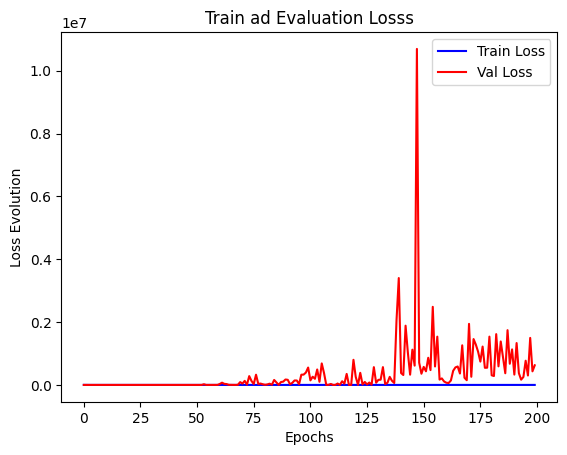

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(37.1101, device='cuda:0')
RMSE: tensor(6.0918, device='cuda:0')
MAE: tensor(4.5224, device='cuda:0')
Spearman Corr: tensor(0.6857, device='cuda:0')


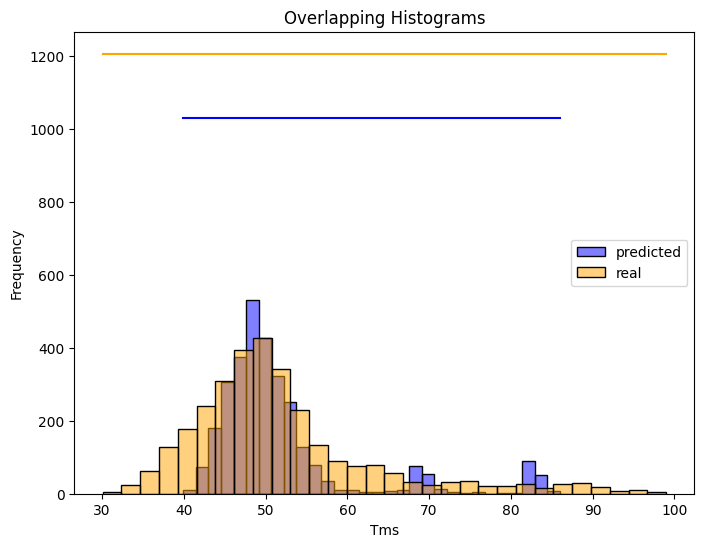

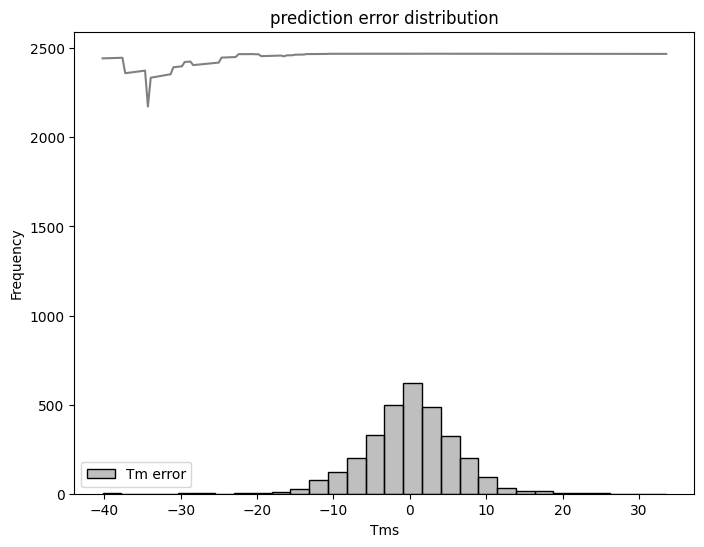

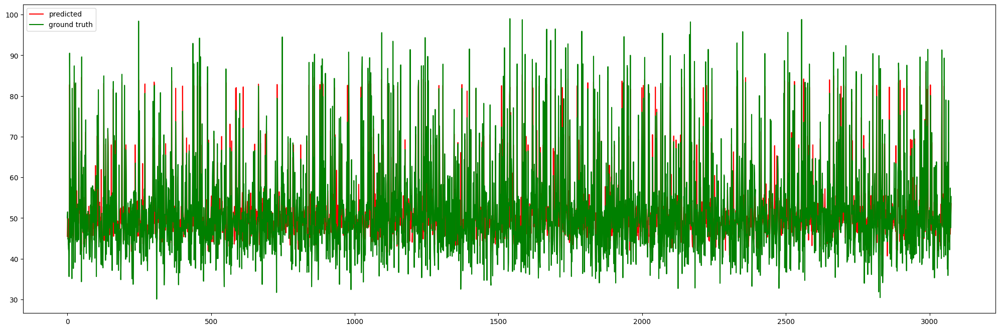

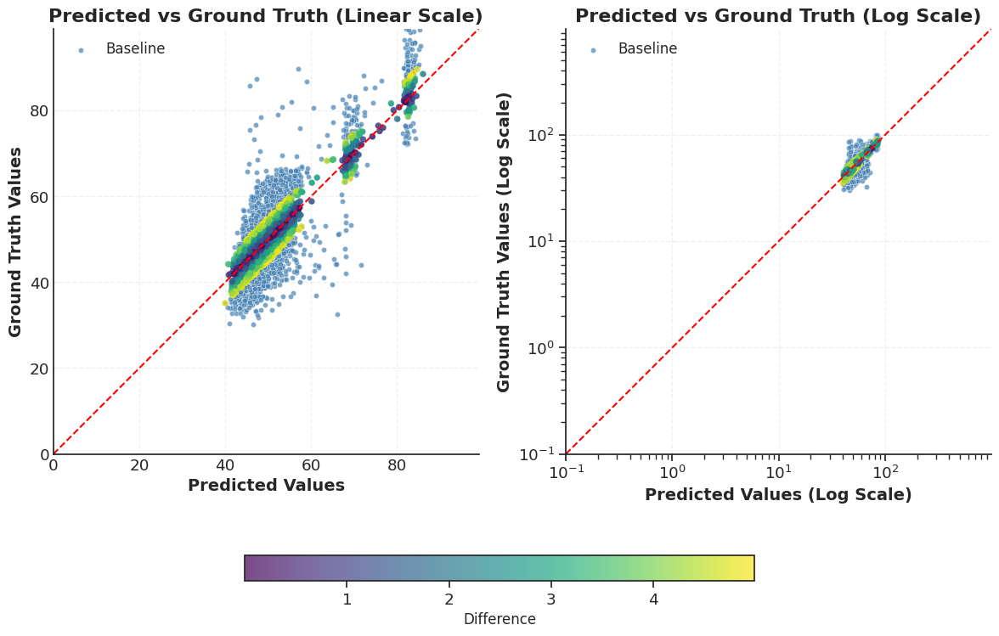

In [13]:

seq_struct_pred_W = LA_MLP_pred(embeddings_dim=1280, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)

optESM = torch.optim.AdamW(seq_struct_pred_W.parameters(), lr=1e-3)
lossESM= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

#import ipdb; ipdb.set_trace()
generating_results_approaches(seq_struct_pred_W, Trainer3, train_embedding_esm2, val_embedding_esm2, 
                              test_embedding_esm2, lossESM, optESM, epochs, device,
                              path_progres=path_progresESM, 
                              checkpoint_path=checkpoint_pathESM,
                              output_metrics=config['initial_paths']['output_metrics_ESM_only'])



### For Inverse Folding PiFold Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/PiFold_only/Global/AllMeltome_composed_loss_globalAvgtm_speed/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 1443.805 val loss: 158.777


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 164.645 val loss: 196.010


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 150.010 val loss: 164.276


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 137.250 val loss: 150.527


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 124.078 val loss: 138.144


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 113.247 val loss: 147.928


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 107.855 val loss: 126.080


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 98.846 val loss: 124.880


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 92.492 val loss: 133.076


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 87.007 val loss: 120.321


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 82.396 val loss: 120.869


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 77.207 val loss: 116.412


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 75.957 val loss: 115.169


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 73.305 val loss: 116.838


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 74.005 val loss: 118.547


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 72.798 val loss: 152.440


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 72.188 val loss: 121.614


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 68.324 val loss: 121.394


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 66.101 val loss: 126.585


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 68.108 val loss: 115.762


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 64.431 val loss: 122.721


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 60.566 val loss: 119.405


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 61.420 val loss: 122.331


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 58.742 val loss: 128.280


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 57.172 val loss: 115.554


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 55.313 val loss: 123.636


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 61.203 val loss: 123.590


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 56.382 val loss: 132.985


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 54.509 val loss: 133.215


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 50.455 val loss: 117.461


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 49.313 val loss: 119.229


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 49.888 val loss: 124.547


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 48.615 val loss: 117.121


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 47.426 val loss: 119.407


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 46.551 val loss: 129.113


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 45.432 val loss: 123.101


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 47.078 val loss: 134.006


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 46.161 val loss: 125.959


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 46.818 val loss: 121.074


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 45.616 val loss: 126.816


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 44.511 val loss: 124.831


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 45.463 val loss: 123.748


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 45.615 val loss: 131.654


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 44.260 val loss: 122.729


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 43.671 val loss: 123.596


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 42.548 val loss: 121.080


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 41.553 val loss: 122.867


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 41.451 val loss: 118.187


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 39.944 val loss: 118.699


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 39.866 val loss: 132.337


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 40.053 val loss: 113.888


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 38.018 val loss: 129.024


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 39.119 val loss: 118.807


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 39.180 val loss: 116.049


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 38.254 val loss: 120.164


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 38.108 val loss: 120.400


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 38.781 val loss: 125.464


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 38.075 val loss: 127.552


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 37.434 val loss: 130.832


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 36.888 val loss: 119.472


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 36.793 val loss: 119.103


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 37.592 val loss: 122.774


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 36.235 val loss: 123.739


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 34.800 val loss: 124.284


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 33.723 val loss: 125.881


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 35.064 val loss: 123.792


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 36.302 val loss: 122.311


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 35.297 val loss: 122.687


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 35.107 val loss: 117.616


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 34.529 val loss: 117.962


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 35.089 val loss: 114.171


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 34.856 val loss: 123.028


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 35.620 val loss: 118.218


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 36.325 val loss: 114.819


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 34.171 val loss: 117.028


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 33.406 val loss: 112.709


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 32.682 val loss: 116.863


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 30.971 val loss: 121.213


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 30.868 val loss: 136.161


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 34.463 val loss: 119.759


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 32.029 val loss: 117.436


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 30.769 val loss: 125.098


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 31.053 val loss: 113.765


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 31.491 val loss: 114.611


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 31.111 val loss: 119.835


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 30.784 val loss: 115.575


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 29.544 val loss: 120.094


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 30.670 val loss: 132.419


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 29.880 val loss: 118.590


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 30.387 val loss: 118.394


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 31.615 val loss: 116.904


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 30.477 val loss: 122.215


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 27.799 val loss: 127.087


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 29.018 val loss: 118.096


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 28.397 val loss: 122.473


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 29.716 val loss: 117.524


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 28.882 val loss: 120.417


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 28.950 val loss: 128.501


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 28.482 val loss: 123.187


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 28.630 val loss: 116.389


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 29.106 val loss: 124.388


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 27.380 val loss: 119.211


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 27.922 val loss: 132.145


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 27.525 val loss: 121.333


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 27.585 val loss: 137.925


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 26.243 val loss: 126.190


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 27.509 val loss: 122.542


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 28.735 val loss: 124.333


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 27.274 val loss: 119.403


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 27.258 val loss: 122.221


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 26.405 val loss: 119.568


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 26.320 val loss: 124.182


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 26.143 val loss: 123.001


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 25.993 val loss: 122.050


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 25.650 val loss: 120.763


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 26.118 val loss: 118.116


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 25.323 val loss: 118.423


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 26.140 val loss: 123.921


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 25.943 val loss: 144.580


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 32.749 val loss: 121.742


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 35.872 val loss: 124.346


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 32.104 val loss: 120.093


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 30.255 val loss: 116.411


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 29.077 val loss: 122.438


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 27.372 val loss: 126.800


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 26.321 val loss: 126.819


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 25.885 val loss: 139.282


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 26.838 val loss: 129.930


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 25.051 val loss: 123.726


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 24.870 val loss: 127.503


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 24.812 val loss: 115.668


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 24.932 val loss: 126.468


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 24.148 val loss: 130.395


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 24.659 val loss: 128.757


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 24.423 val loss: 120.035


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 24.288 val loss: 123.404


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 23.372 val loss: 129.154


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 22.364 val loss: 130.350


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 24.170 val loss: 122.852


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 23.143 val loss: 124.249


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 23.227 val loss: 142.254


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 23.808 val loss: 127.534


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 22.683 val loss: 123.634


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 22.493 val loss: 133.830


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 22.221 val loss: 123.847


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 24.286 val loss: 131.930


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 24.119 val loss: 136.070


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 23.612 val loss: 125.405


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 23.308 val loss: 122.958


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 22.682 val loss: 125.210


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 22.585 val loss: 128.397


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 22.993 val loss: 154.208


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 22.665 val loss: 157.885


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 23.228 val loss: 136.584


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 24.096 val loss: 132.637


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 22.974 val loss: 130.184


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 23.014 val loss: 128.474


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 23.590 val loss: 128.589


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 21.855 val loss: 149.670


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 22.525 val loss: 135.306


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 23.061 val loss: 153.524


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 22.868 val loss: 131.164


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 22.691 val loss: 137.516


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 23.174 val loss: 131.981


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 22.411 val loss: 126.677


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 22.614 val loss: 132.448


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 22.623 val loss: 135.790


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 23.070 val loss: 127.618


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 22.546 val loss: 127.429


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 21.078 val loss: 138.157


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 23.645 val loss: 126.250


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 23.239 val loss: 133.976


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 21.689 val loss: 124.914


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 23.215 val loss: 144.183


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 22.045 val loss: 134.957


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 22.001 val loss: 142.065


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 21.849 val loss: 126.778


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 23.577 val loss: 144.445


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 22.715 val loss: 144.887


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 22.308 val loss: 137.975


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 23.152 val loss: 151.102


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 22.226 val loss: 141.044


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 22.398 val loss: 129.108


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 22.589 val loss: 131.794


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 20.929 val loss: 143.430


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 21.423 val loss: 133.957


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 21.320 val loss: 153.028


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 20.522 val loss: 145.974


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 21.271 val loss: 130.916


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 21.013 val loss: 132.129


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 22.082 val loss: 144.626


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 22.123 val loss: 146.983


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 22.073 val loss: 133.030


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 20.753 val loss: 136.263


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 21.604 val loss: 143.337


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 20.980 val loss: 150.513


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 21.331 val loss: 138.669


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 20.754 val loss: 147.992


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 21.366 val loss: 140.453


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 20.390 val loss: 141.118


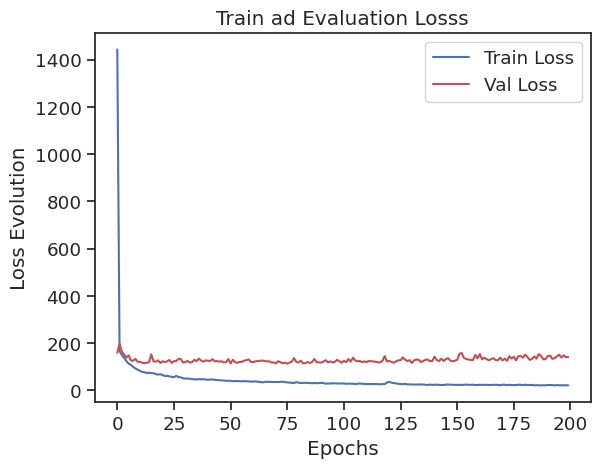

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(91.3086, device='cuda:0')
RMSE: tensor(9.5556, device='cuda:0')
MAE: tensor(7.0510, device='cuda:0')
Spearman Corr: tensor(0.3544, device='cuda:0')


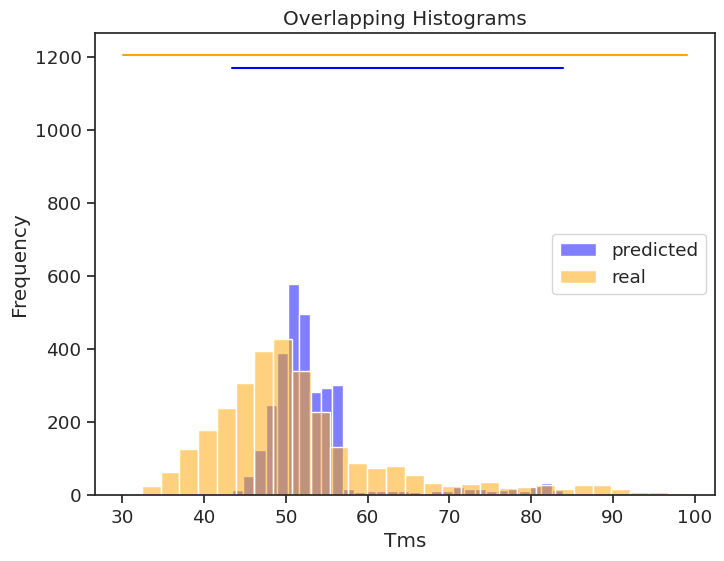

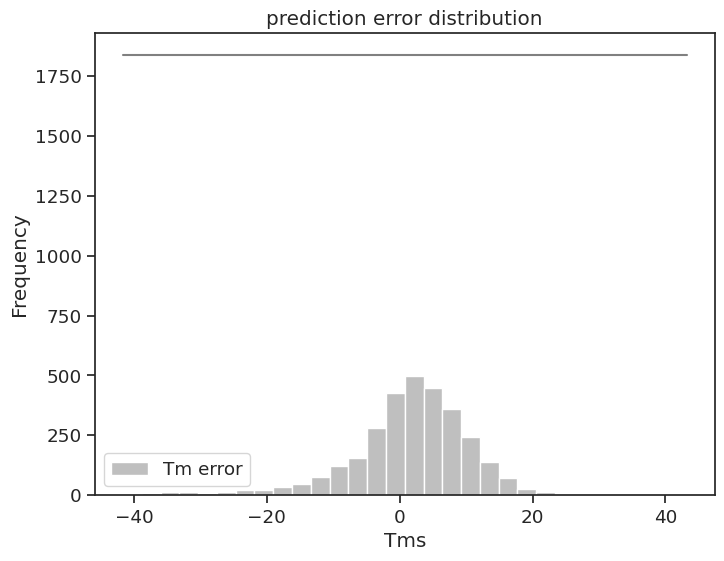

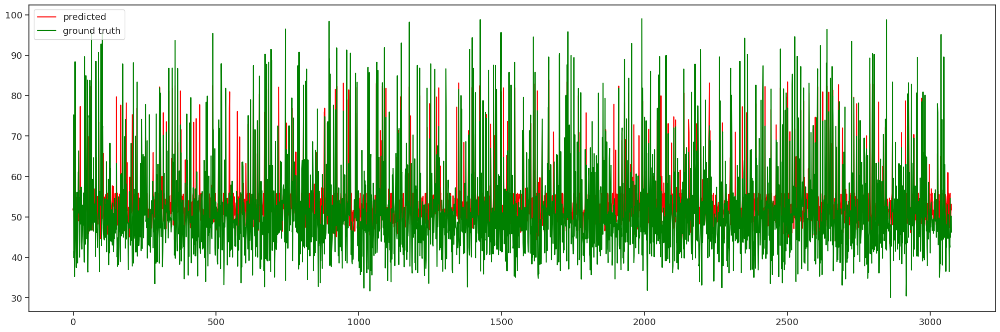

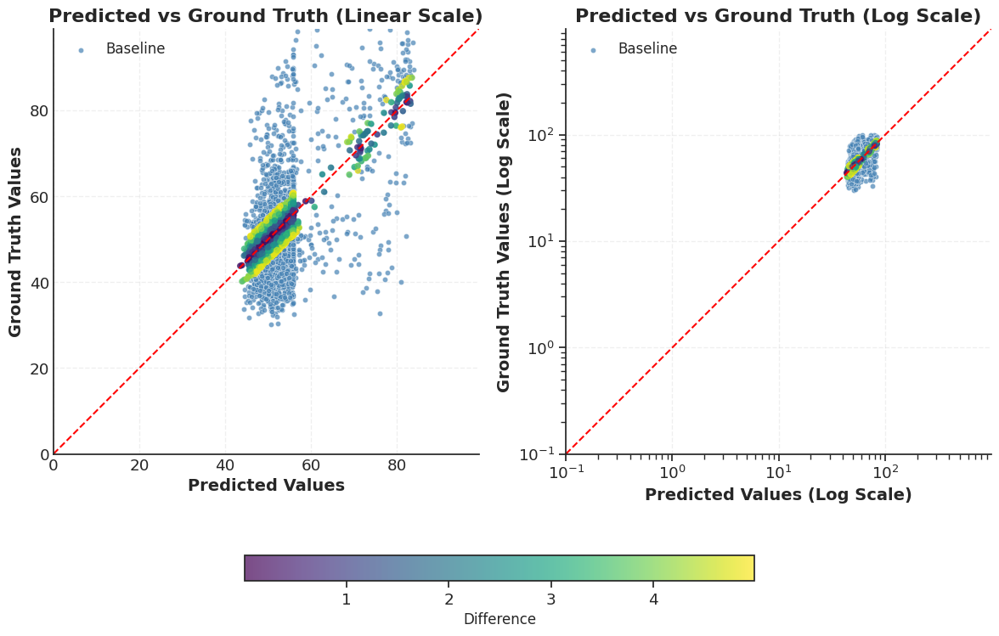

In [14]:

seq_struct_pred_W_PiFold = LA_MLP_pred(embeddings_dim=128, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optPiFold = torch.optim.AdamW(seq_struct_pred_W_PiFold.parameters(), lr=1e-3)
lossPiFold= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

generating_results_approaches(seq_struct_pred_W_PiFold, Trainer3, train_embedding_PiFold, val_embedding_PiFold, 
                              test_embedding_PiFold, lossPiFold, optPiFold, epochs, device,
                              path_progres=path_progresPiFold, 
                              checkpoint_path=checkpoint_pathPiFold,
                              output_metrics=config['initial_paths']['output_metrics_PiFold_only'])


### For Both ESM2 and Inverse Folding PiFold Contributions Together Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/Mix/Global/AllMeltome_composed_loss_globalAvgtm_speed/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 1 loss: 1416.764 val loss: 104.975


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 2 loss: 82.444 val loss: 68.481


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 3 loss: 63.913 val loss: 62.117


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 4 loss: 52.486 val loss: 56.544


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 5 loss: 45.127 val loss: 54.566


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 6 loss: 40.041 val loss: 52.378


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 7 loss: 50.729 val loss: 59.101


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 8 loss: 42.570 val loss: 53.792


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 9 loss: 39.599 val loss: 57.182


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 10 loss: 36.623 val loss: 53.556


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 11 loss: 35.394 val loss: 58.199


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 12 loss: 32.861 val loss: 52.159


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 13 loss: 31.948 val loss: 57.677


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 14 loss: 31.167 val loss: 51.216


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 15 loss: 29.156 val loss: 55.616


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 16 loss: 29.174 val loss: 55.774


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 17 loss: 27.277 val loss: 53.796


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 18 loss: 26.322 val loss: 53.788


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 19 loss: 26.027 val loss: 55.252


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 20 loss: 29.215 val loss: 52.193


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 21 loss: 24.983 val loss: 55.415


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 22 loss: 25.273 val loss: 53.235


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 23 loss: 22.828 val loss: 54.326


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 24 loss: 23.488 val loss: 55.151


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 25 loss: 22.274 val loss: 51.615


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 26 loss: 22.666 val loss: 53.619


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 27 loss: 20.113 val loss: 57.016


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 28 loss: 21.812 val loss: 54.959


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 29 loss: 19.067 val loss: 54.574


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 30 loss: 20.205 val loss: 53.884


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 31 loss: 19.098 val loss: 50.160


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 32 loss: 19.455 val loss: 51.520


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 33 loss: 19.786 val loss: 53.969


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 34 loss: 19.549 val loss: 57.356


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 35 loss: 18.410 val loss: 57.139


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 36 loss: 17.262 val loss: 58.236


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 37 loss: 18.342 val loss: 50.946


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 38 loss: 17.146 val loss: 57.738


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 39 loss: 17.755 val loss: 55.197


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 40 loss: 18.566 val loss: 118.169


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 41 loss: 18.102 val loss: 51.151


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 42 loss: 18.129 val loss: 801.603


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 43 loss: 17.592 val loss: 50.032


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 44 loss: 16.735 val loss: 51.642


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 45 loss: 16.324 val loss: 59.806


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 46 loss: 15.029 val loss: 53.929


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 47 loss: 15.012 val loss: 58.285


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 48 loss: 15.567 val loss: 62.228


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 49 loss: 15.694 val loss: 59.376


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 50 loss: 14.923 val loss: 54.350


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 51 loss: 15.474 val loss: 63.411


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 52 loss: 15.026 val loss: 54.234


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 53 loss: 15.921 val loss: 57.840


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 54 loss: 14.056 val loss: 50.821


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 55 loss: 14.906 val loss: 56.244


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 56 loss: 14.881 val loss: 60.148


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 57 loss: 14.878 val loss: 49.122


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 58 loss: 13.368 val loss: 55.093


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 59 loss: 14.262 val loss: 56.507


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 60 loss: 13.923 val loss: 52.173


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 61 loss: 13.882 val loss: 55.486


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 62 loss: 13.888 val loss: 55.462


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 63 loss: 12.889 val loss: 52.225


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 64 loss: 12.757 val loss: 53.707


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 65 loss: 13.045 val loss: 57.431


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 66 loss: 13.912 val loss: 51.010


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 67 loss: 13.162 val loss: 54.431


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 68 loss: 13.760 val loss: 57.054


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 69 loss: 13.516 val loss: 56.860


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 70 loss: 13.745 val loss: 53.710


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 71 loss: 12.540 val loss: 55.399


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 72 loss: 13.390 val loss: 56.092


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 73 loss: 12.836 val loss: 60.789


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 74 loss: 13.298 val loss: 55.194


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 75 loss: 11.732 val loss: 56.374


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 76 loss: 12.788 val loss: 55.965


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 77 loss: 13.284 val loss: 57.360


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 78 loss: 12.273 val loss: 62.975


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 79 loss: 12.634 val loss: 63.717


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 80 loss: 11.810 val loss: 64.078


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 81 loss: 10.953 val loss: 61.611


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 82 loss: 10.811 val loss: 56.960


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 83 loss: 12.084 val loss: 61.129


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 84 loss: 11.466 val loss: 70.426


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 85 loss: 10.559 val loss: 63.015


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 86 loss: 11.347 val loss: 57.988


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 87 loss: 11.379 val loss: 63.253


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 88 loss: 11.345 val loss: 64.238


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 89 loss: 11.077 val loss: 57.044


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 90 loss: 11.882 val loss: 60.155


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 91 loss: 11.351 val loss: 63.722


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 92 loss: 10.706 val loss: 58.818


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 93 loss: 10.551 val loss: 60.324


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 94 loss: 10.664 val loss: 60.736


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 95 loss: 10.517 val loss: 56.111


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 96 loss: 11.222 val loss: 53.914


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 97 loss: 10.406 val loss: 69.000


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 98 loss: 10.429 val loss: 56.339


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 99 loss: 10.345 val loss: 59.771


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100 loss: 9.801 val loss: 58.565


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101 loss: 10.263 val loss: 61.355


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102 loss: 10.609 val loss: 70.714


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103 loss: 10.365 val loss: 58.892


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104 loss: 10.023 val loss: 59.000


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105 loss: 11.135 val loss: 60.793


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106 loss: 9.975 val loss: 58.046


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107 loss: 9.662 val loss: 68.433


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108 loss: 10.128 val loss: 59.604


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109 loss: 10.887 val loss: 61.946


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110 loss: 10.239 val loss: 60.742


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111 loss: 10.792 val loss: 56.126


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112 loss: 9.896 val loss: 58.599


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113 loss: 9.904 val loss: 64.552


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114 loss: 9.722 val loss: 56.802


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115 loss: 9.570 val loss: 56.022


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116 loss: 9.608 val loss: 65.596


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117 loss: 9.129 val loss: 58.412


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118 loss: 9.327 val loss: 56.950


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119 loss: 9.072 val loss: 57.983


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120 loss: 9.572 val loss: 63.802


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121 loss: 9.217 val loss: 57.212


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122 loss: 9.112 val loss: 65.475


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123 loss: 9.185 val loss: 60.724


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124 loss: 9.703 val loss: 63.284


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125 loss: 9.985 val loss: 61.288


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126 loss: 10.548 val loss: 60.391


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127 loss: 10.343 val loss: 65.975


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128 loss: 9.158 val loss: 61.803


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129 loss: 9.231 val loss: 57.592


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130 loss: 9.233 val loss: 62.310


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131 loss: 9.077 val loss: 73.541


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132 loss: 9.040 val loss: 64.179


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133 loss: 9.802 val loss: 68.253


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134 loss: 9.775 val loss: 67.518


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135 loss: 9.088 val loss: 258.042


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136 loss: 9.932 val loss: 59.942


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137 loss: 8.843 val loss: 60.357


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138 loss: 9.428 val loss: 68.126


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139 loss: 9.094 val loss: 72.526


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140 loss: 8.756 val loss: 98.468


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141 loss: 8.784 val loss: 72.872


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142 loss: 8.954 val loss: 59.285


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143 loss: 9.018 val loss: 65.571


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144 loss: 8.484 val loss: 61.705


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145 loss: 8.636 val loss: 65.544


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146 loss: 8.724 val loss: 59.799


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147 loss: 8.469 val loss: 64.426


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148 loss: 9.049 val loss: 60.168


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149 loss: 8.871 val loss: 65.519


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150 loss: 9.276 val loss: 65.100


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151 loss: 8.962 val loss: 72.238


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152 loss: 9.071 val loss: 15277.772


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153 loss: 8.480 val loss: 64.286


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154 loss: 8.777 val loss: 183.186


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155 loss: 8.883 val loss: 64.443


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156 loss: 9.188 val loss: 62.776


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157 loss: 8.571 val loss: 66.346


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158 loss: 9.209 val loss: 62.703


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159 loss: 8.858 val loss: 58.934


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160 loss: 8.260 val loss: 66.963


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161 loss: 8.424 val loss: 73.211


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162 loss: 8.364 val loss: 11437.170


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163 loss: 7.872 val loss: 58.905


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164 loss: 7.810 val loss: 3267.180


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165 loss: 8.329 val loss: 5326.313


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166 loss: 8.180 val loss: 162.540


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167 loss: 8.009 val loss: 5192.566


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168 loss: 8.195 val loss: 27428.361


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169 loss: 8.318 val loss: 1933.790


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170 loss: 8.396 val loss: 1918.991


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171 loss: 8.675 val loss: 60.150


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172 loss: 8.698 val loss: 72.450


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173 loss: 8.254 val loss: 62.801


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174 loss: 7.428 val loss: 66.197


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175 loss: 8.396 val loss: 65.119


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176 loss: 8.256 val loss: 64.090


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177 loss: 7.367 val loss: 19791.390


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178 loss: 7.823 val loss: 61.489


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179 loss: 7.925 val loss: 62.247


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180 loss: 7.595 val loss: 1189.620


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181 loss: 8.141 val loss: 68.789


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182 loss: 7.492 val loss: 82.261


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183 loss: 8.103 val loss: 58.205


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184 loss: 8.398 val loss: 65.204


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185 loss: 8.327 val loss: 61.876


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186 loss: 8.274 val loss: 61.094


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187 loss: 7.798 val loss: 61.501


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188 loss: 8.329 val loss: 120.223


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189 loss: 7.919 val loss: 77.235


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190 loss: 7.724 val loss: 75.332


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191 loss: 7.648 val loss: 2406.809


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192 loss: 8.538 val loss: 64.110


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193 loss: 7.880 val loss: 64.404


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194 loss: 7.781 val loss: 66.189


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195 loss: 8.376 val loss: 66.447


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196 loss: 7.732 val loss: 65.318


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197 loss: 7.844 val loss: 70.248


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198 loss: 7.912 val loss: 72.869


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199 loss: 8.142 val loss: 1703.963


training epoch by batches:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200 loss: 7.791 val loss: 802.767


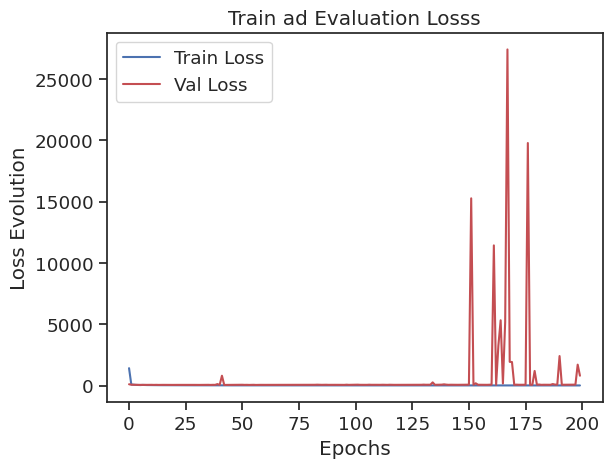

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(37.3111, device='cuda:0')
RMSE: tensor(6.1083, device='cuda:0')
MAE: tensor(4.5890, device='cuda:0')
Spearman Corr: tensor(0.6897, device='cuda:0')


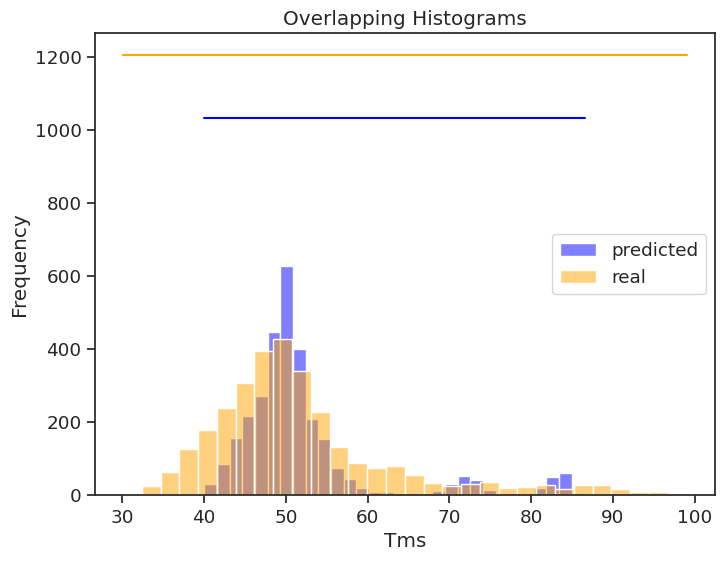

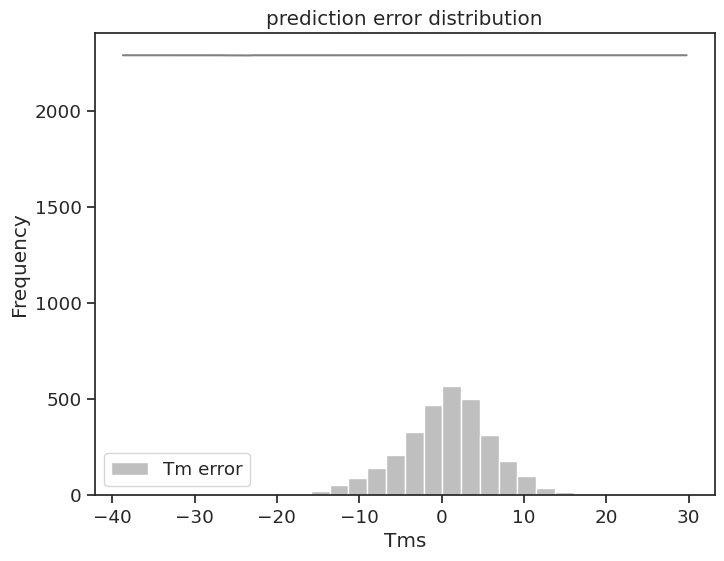

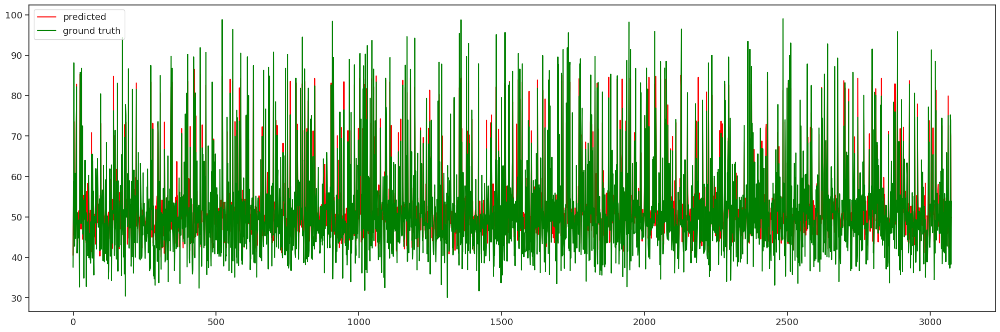

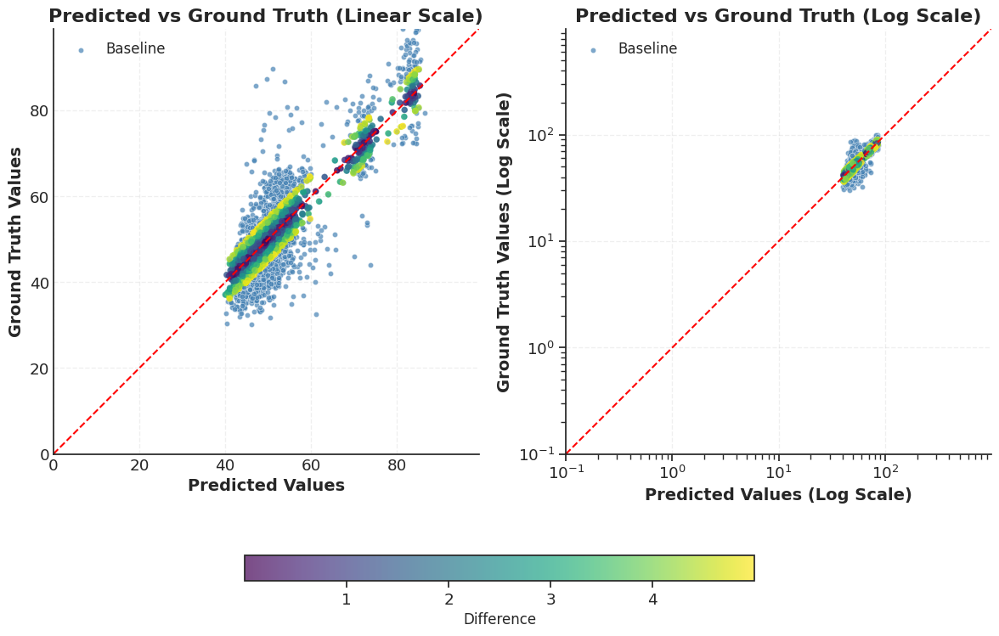

In [15]:

import torchsort, sys
sys.path.append(os.path.abspath("../ref_models/fast_soft_sort"))
from ref_models.fast_soft_sort.fast_soft_sort.pytorch_ops import soft_rank, soft_sort

#import ipdb; ipdb.set_trace()
seq_struct_pred_W_merged = LA_MLP_pred(embeddings_dim=1280+128, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optIFM = torch.optim.AdamW(seq_struct_pred_W_merged.parameters(), lr=1e-3)
lossIFM= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

#import ipdb; ipdb.set_trace()
generating_results_approaches(seq_struct_pred_W_merged, Trainer3, train_embedding_merged, val_embedding_merged, 
                              test_embedding_merged, lossIFM, optIFM, epochs, device,
                              path_progres=path_progresMix, 
                              checkpoint_path=checkpoint_pathMix,
                              output_metrics=config['initial_paths']['output_metrics_Both'])
